# Image encoding using a Variational Auto Encoder

Code based on keras example: https://keras.io/examples/generative/vae/

## Setup

In [1]:
import numpy as np
import os
import sys
import tensorrt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose, Dropout, UpSampling2D

from skimage.transform import rotate, resize
from skimage.filters import gaussian

from skimage.io import imsave
import glob
from PIL import Image

import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

#Import LOCAL dependencies
import idl as idl
from image_grids import show_image_row as show_image_row
import image_grids as image_grids# scatter_images
import importlib

importlib.reload(image_grids)

2023-05-02 19:23:11.740267: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<module 'image_grids' from '/home/emts/vae/image_grids.py'>

In [2]:
def tvscale(img, invert=False, plot_size=(6,6)):

    plt.rcParams['figure.figsize'] = plot_size

    if invert==True:
        imgplot = plt.imshow(img,interpolation="none", origin='lower',cmap='gray')
    else:
        imgplot = plt.imshow(img,interpolation="none",cmap='gray')
    plt.axis('off')
    plt.show()

def im_scatter(x, y, image, ax=None, zoom=1):
    if ax is None:
        ax = plt.gca()
    im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0 in zip(x, y):
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    return artists

#
#   Changed original function to accept arbitrary latent_dim and choose pair of
#   dimensions to display
#
def plot_latent(_decoder, _latent_dim, _dim1, _dim2):
    # display a n*n 2D manifold of digits
    n = 30
    digit_size = ng
    scale = 5.0
    figsize = 15
    figure = np.zeros((digit_size * n, digit_size * n, 3))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            code = [0]*_latent_dim
            code[_dim1] = xi
            code[_dim2] = yi
            z_sample = np.array([code])
            x_decoded = _decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size,n_channels)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size, :
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    #plt.xticks(pixel_range, sample_range_x)
    #plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

def scatter_images(_x, _y, _image_array, xlim=(0,10), ylim=(0,10), plot_size=(10,10),  zoom=1):
    
    plt.rcParams['figure.figsize'] = [plot_size[0], plot_size[1]]
    fig, ax = plt.subplots()
    ax.set_axis_off()
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    for i, image_i in enumerate(_image_array):       
        im_scatter(_x[i], _y[i], image_i, zoom=zoom, ax=ax)
        
    plt.show()

def load_images(_path, _ng, _n):
    
    file_list = sorted(glob.glob(_path + "*.jpg"))
    
    print(">>> Reading ", len(file_list), " images")
    
    images = []
    cont = 0
    for file_i in file_list:

        ima_i = np.asarray(Image.open(file_i), dtype=np.float32)[:,:,0:3]/255
        
        ima_i = resize(ima_i, (_ng, _ng, 3), preserve_range=True)
        
        images.append(ima_i)
        
        cont = cont+1
        if (cont == _n): break
        
    return np.asarray(images)


class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

def get_encoder(_ng, _n_channels, _latent_dim):
    
    encoder_inputs = keras.Input(shape=(_ng,_ng, _n_channels))
    x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(encoder_inputs)
    x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(256, 3, activation="relu", strides=1, padding="same")(x)
    x = layers.Conv2D(256, 3, activation="relu", strides=1, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    #--- Use a dense layer so we can easily reshape any tensor from the previous layer into the desired latent space
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation="relu")(x)

    z_mean    = layers.Dense(_latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(_latent_dim, name="z_log_var")(x)
    z         = Sampling()([z_mean, z_log_var])

    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
    
    return encoder

def get_decoder(_latent_dim, _n_channels):
    
    latent_inputs = keras.Input(shape=(_latent_dim,))
    x = layers.Dense(16 * 16 * 64, activation="relu")(latent_inputs) #--- Change this to match endoder pooling
    x = layers.Reshape((16, 16, 64))(x)
    x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)

    x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same")(x)

    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)

    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2D(32, 3, activation="relu", strides=1, padding="same")(x)
    x = layers.Conv2D(32, 3, activation="relu", strides=1, padding="same")(x)

    decoder_outputs = layers.Conv2DTranspose(_n_channels, 3, activation="sigmoid", padding="same")(x)
    decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")

    return decoder

class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= ng * ng  #--- OjO, check this
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

In [3]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


2023-05-02 19:23:15.428062: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-02 19:23:15.710599: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-02 19:23:15.710762: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

### Read images

(301, 128, 128, 3)


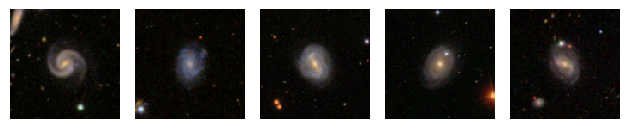

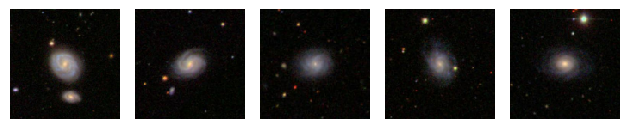

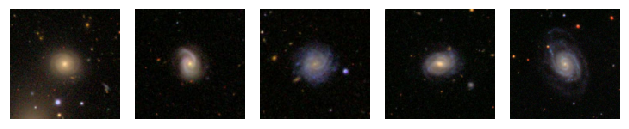

In [4]:
#--- Image size
ng = 128

#--- RGB or grayscale, keep fixed
n_channels = 3

x_train = np.load("data/cosmo-late.npy").astype(np.float32)/255
print(x_train.shape)

for i in range(3):
    show_image_row([x_train[i*5+0],x_train[i*5+1],x_train[i*5+2],x_train[i*5+3],x_train[i*5+4]])


## Training

### Instantiate VAE net and train

In [5]:
#--- Number of latent dimensions. This is a key hyperparameter as it determines the size of the
#    latent space. 
latent_dim = 8

#--- Assemble VAE
encoder = get_encoder(ng, n_channels, latent_dim)
encoder.summary()
decoder = get_decoder(latent_dim, n_channels)
decoder.summary()
vae = VAE(encoder, decoder)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 64  36928       ['conv2d[0][0]']                 
                                )                                                           

In [6]:
#--- Compile and train

#Disable auto-suspend
import subprocess
cmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 0"
result = subprocess.run(cmd, shell=True, capture_output=True)

#Compile
vae.compile(optimizer=keras.optimizers.Adam())

#Set epoch number and retrain flag
ep = 2000
retrain = False

# set the path of the file you want to check
file_path = 'data/vae_saved_{0}w.tf.index'.format(str(ep))

# check if the file exists
if os.path.exists(file_path) and retrain == False:
    vae.load_weights('data/vae_saved_{0}w.tf'.format(str(ep)))
else:
    vae.fit(x_train, epochs=ep, batch_size=32)
    vae.save_weights('data/vae_saved_{0}w.tf'.format(str(ep)))

#Resume auto-suspend
cmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 1800"
result = subprocess.run(cmd, shell=True, capture_output=True)

In [7]:
'''
#--- Train for a bunch of epochs

#Disable auto-suspend
import subprocess
cmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 0"
result = subprocess.run(cmd, shell=True, capture_output=True)

#Compile
vae.compile(optimizer=keras.optimizers.Adam())

ep = 200

while ep <= 2000:
    vae.fit(x_train, epochs=ep, batch_size=32)
    vae.save_weights('data/vae_saved_{0}w.tf'.format(str(ep)))
    ep = ep + 200

#Resume auto-suspend
cmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 1800"
result = subprocess.run(cmd, shell=True, capture_output=True)
'''

'\n#--- Train for a bunch of epochs\n\n#Disable auto-suspend\nimport subprocess\ncmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 0"\nresult = subprocess.run(cmd, shell=True, capture_output=True)\n\n#Compile\nvae.compile(optimizer=keras.optimizers.Adam())\n\nep = 200\n\nwhile ep <= 2000:\n    vae.fit(x_train, epochs=ep, batch_size=32)\n    vae.save_weights(\'data/vae_saved_{0}w.tf\'.format(str(ep)))\n    ep = ep + 200\n\n#Resume auto-suspend\ncmd = "gsettings set org.gnome.settings-daemon.plugins.power sleep-inactive-ac-timeout 1800"\nresult = subprocess.run(cmd, shell=True, capture_output=True)\n'

## Previous Work

### Show latent space for a few pairs of dimensions

2023-05-02 19:23:19.385221: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-05-02 19:23:20.504832: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8900


1/1 [==============================] - 0s 12ms/step


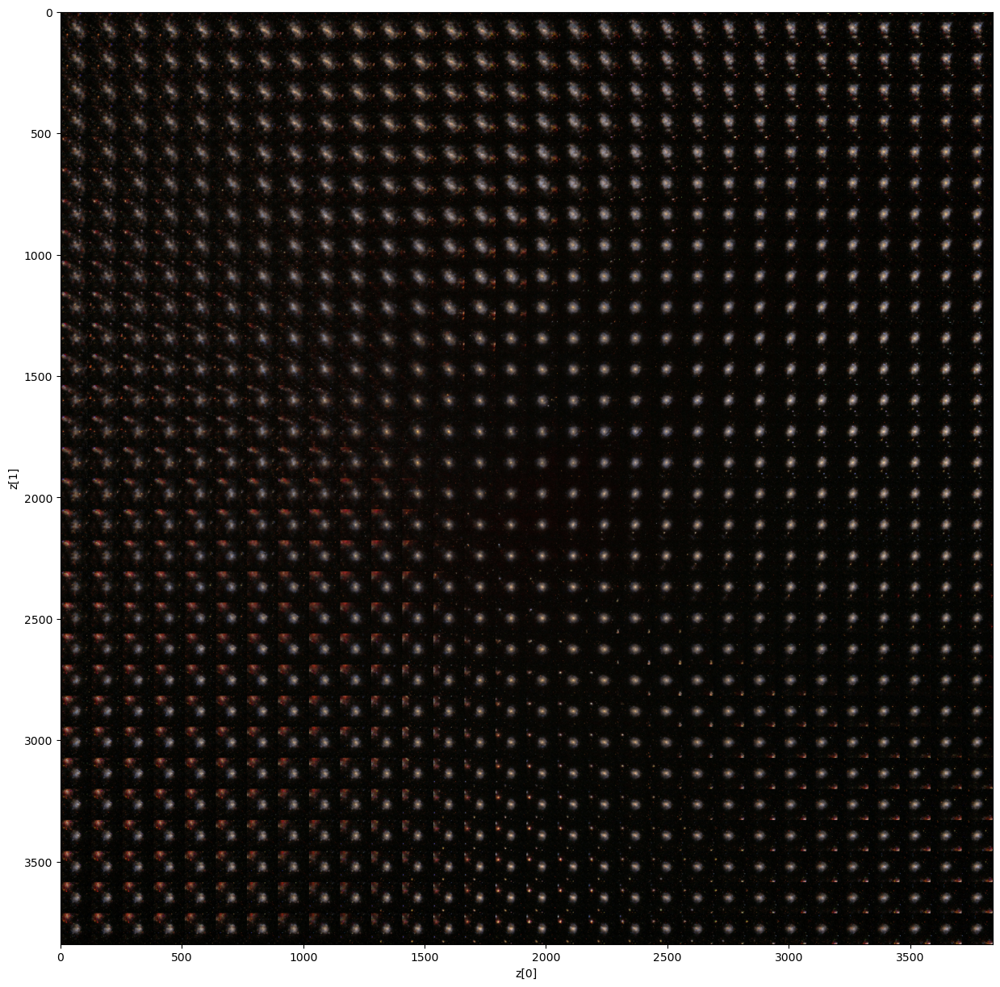

1/1 [==============================] - 0s 12ms/step


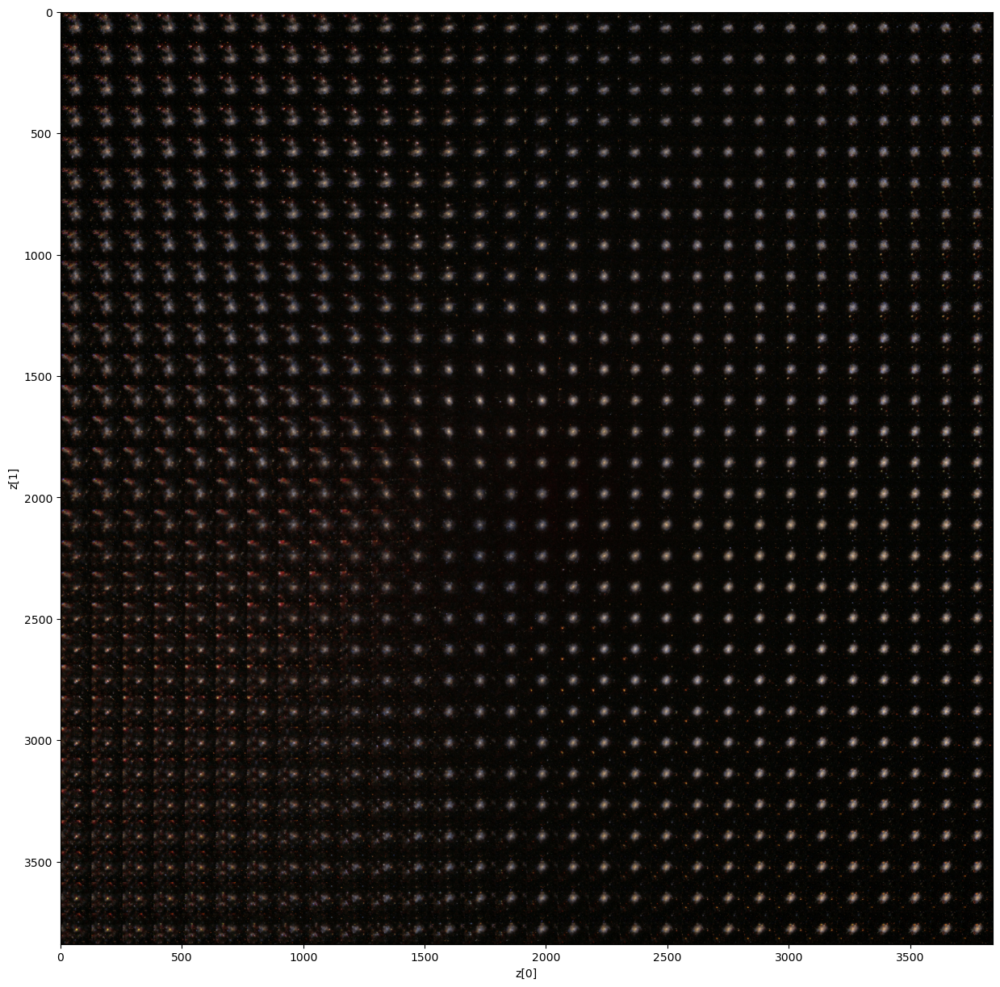

1/1 [==============================] - 0s 12ms/step


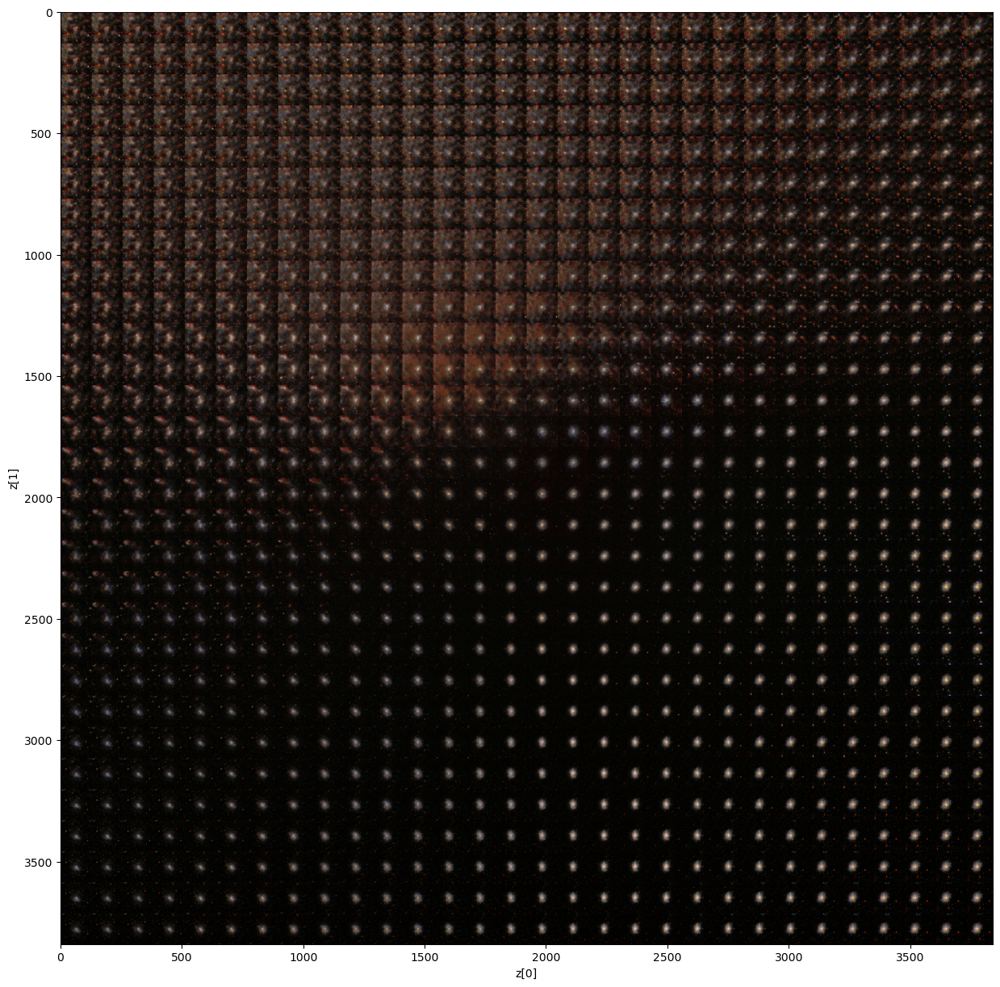

In [8]:
plot_latent(decoder, latent_dim, 0,1)  #--- dimensions 0,1
plot_latent(decoder, latent_dim, 0,2)  #--- dimensions 0,2
plot_latent(decoder, latent_dim, 0,3)  #--- dimensions 0,3

### Ok, now lets see the encoding for one image from the training set. The encoder outputs a list of three elements:

* List of means
* List of variances
* List of samplings

The list of means and variances define the region an image is most likely to occupy in the latent space. The encoder also samples this distribution and produces the list of samplings. 

The list of means should be similar to the list of samplings within the range given by the list of variances. We do not want both lists to be too similar since that would mean that the network is assigning delta functions in latent space instead of Gaussian distriubutions.

In [9]:
code = np.squeeze(np.asarray(encoder(np.expand_dims(x_train[1], axis=0))))

#--- Show first 4 dimensions for clarity:
print(">>> Encoding (mean): ",code[0,0:4])
print(">>> Encoding (var):  ",code[1,0:4])
print(">>> Sampling:        ",code[2,0:4])

>>> Encoding (mean):  [-0.31436217 -0.5791714  -0.09089337 -1.5709568 ]
>>> Encoding (var):   [-9.208063 -9.535191 -9.464481 -8.935326]
>>> Sampling:         [-0.3235817  -0.57919145 -0.08819348 -1.5703347 ]


### Do several samplings of the encoder using the same encoded image. This should produce similar images as we are sampling the distribution at the image position in latent space:

1/1 [==============================] - 0s 12ms/step


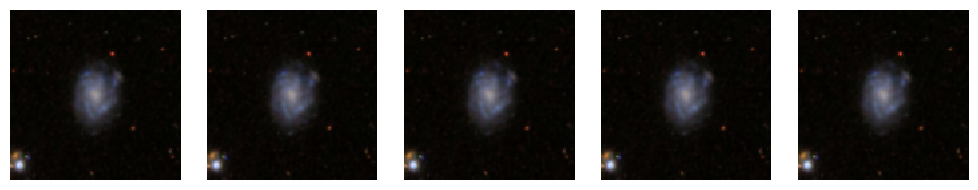

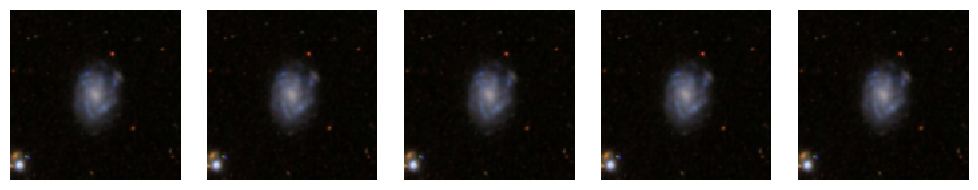

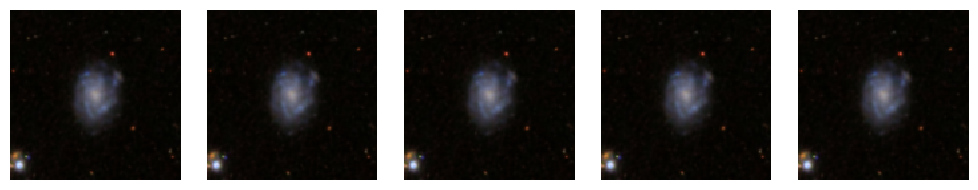

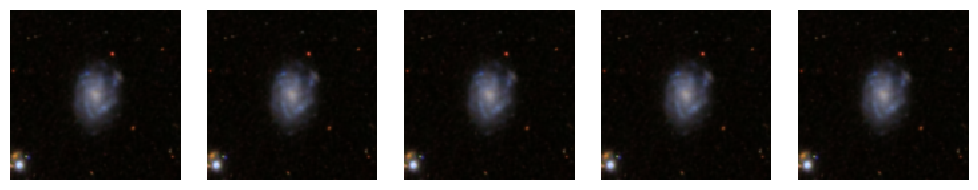

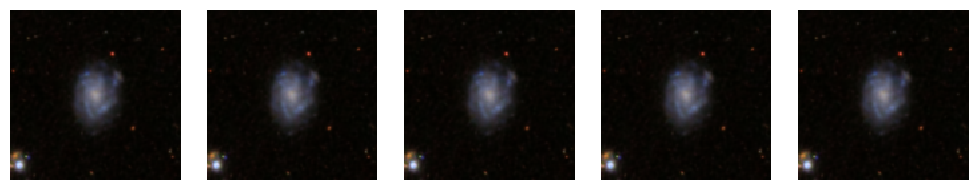

In [10]:
decoded_imas = []
for i in range(25):
    #code = np.squeeze(np.asarray(encoder(np.expand_dims(x_train[1], axis=0))))
    code = np.asarray(encoder(np.expand_dims(x_train[1], axis=0)))[2,:,:]
    decoded_imas.append(decoder.predict(code)[0])
    #print(np.squeeze(code)[2,0:4])

for i in range(5):
    show_image_row([decoded_imas[i*5+0],decoded_imas[i*5+1],decoded_imas[i*5+2],decoded_imas[i*5+3],decoded_imas[i*5+4]], plot_size=[10,2])

### The variance seems small and this is confirmed by the similarity between the decoded images. Lets see how are the images distributed in latent space

>>> type: <class 'list'>
    len: 300
    min : -2.0010638
    max : 2.8409522
    mean: 0.2105128
>>> type: <class 'list'>
    len: 300
    min : -3.0693007
    max : 3.3173172
    mean: -0.039201416


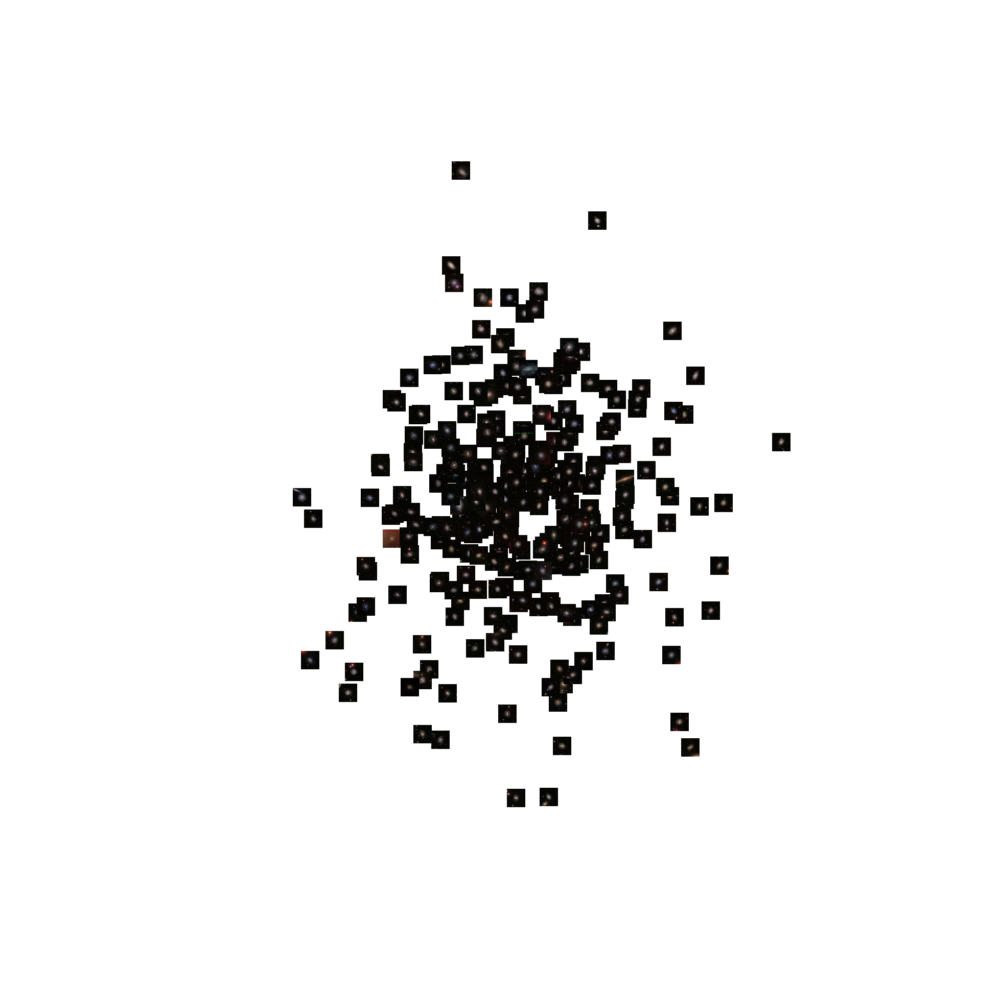

In [11]:
image_array = []
x = []
y = []
for i in range(300):

    image_array.append(x_train[i])
                       
    code_i = np.asarray(encoder(np.expand_dims(x_train[i], axis=0)))[0][0]
    
    x.append(code_i[0])
    y.append(code_i[1])
    
idl.info(x)
idl.info(y)

scl = 5
scatter_images(np.asarray(x),np.asarray(y), image_array, zoom=0.2, xlim=(-scl,scl), ylim=(-scl,scl), plot_size=(25,25))

### Still the latent space should be good for interpolating (although not optimal until we fix the variances). Lets do some interpolation. This is what we do:

* Find the code for two images
* Compute intermediate code, considering the codes as vectors
* Decode the intermediate code

>>> Encoding (mean):  [-0.305718   -0.55894953 -0.102588   -1.5981948  -0.4391724  -0.213035
 -0.6534494   0.6667876 ]
>>> Encoding (mean):  [ 0.6326734   1.2246976   1.4590857  -0.5114716  -0.24970004 -0.4808867
  0.5604007   0.02271261]
1/1 [==============================] - 0s 13ms/step


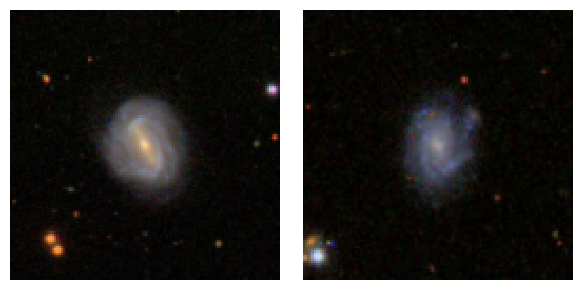

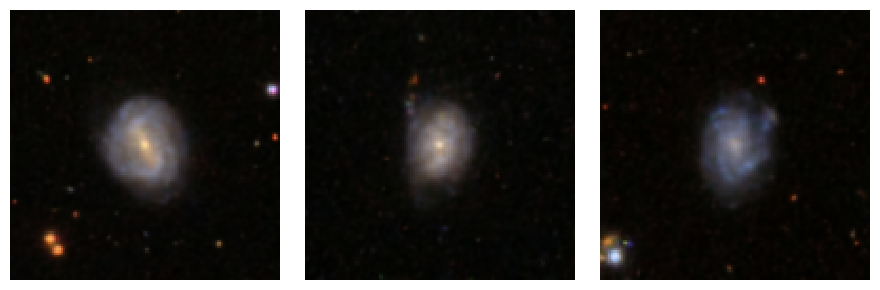

In [12]:
#Cargar 2 imagenes del conjunto de datos

ima_1 = x_train[1]
ima_2 = x_train[2]

code_1 = np.asarray(encoder(np.expand_dims(ima_1, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_1[0])

code_2 = np.asarray(encoder(np.expand_dims(ima_2, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_2[0])

#--- Decode image 1
x_decoded_1 = decoder.predict(code_1)

#--- Decode image 2
x_decoded_2 = decoder.predict(code_2)

#--- Decode middle point
code_x = code_1 + (code_2-code_1)/2
x_decoded_x = decoder.predict(code_x)

#--- Show orginal images
show_image_row([ima_2, ima_1], plot_size=[6,3] )

#--- Show interpolation
show_image_row([x_decoded_2[0], x_decoded_x[0], x_decoded_1[0]],plot_size=[9,3])

>>> Encoding (mean):  [ 2.2331972  -0.7361825  -0.70321214 -0.1501507  -0.3651962  -0.52012175
  0.18804936  0.75675637]
>>> Encoding (mean):  [ 0.21558    -0.5541731   1.4809992  -0.34277892 -0.6218572  -0.45532745
 -0.2013082   0.35939994]
1/1 [==============================] - 0s 13ms/step


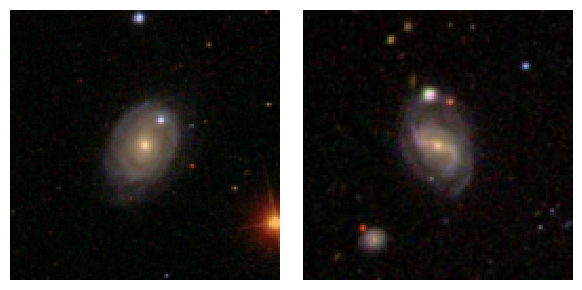

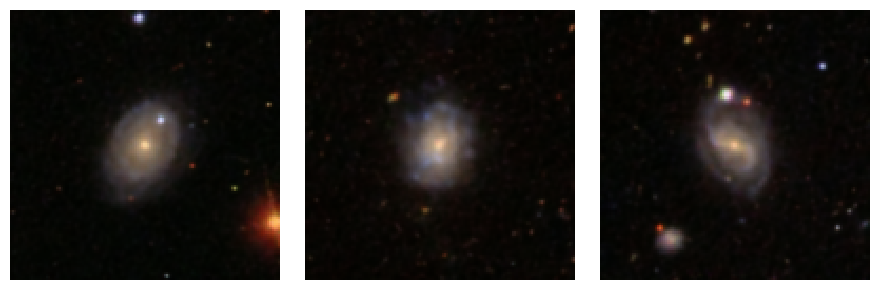

In [13]:
ima_1 = x_train[3]
ima_2 = x_train[4]

code_1 = np.asarray(encoder(np.expand_dims(ima_1, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_1[0])

code_2 = np.asarray(encoder(np.expand_dims(ima_2, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_2[0])

#--- Decode image 1
x_decoded_1 = decoder.predict(code_1)

#--- Decode image 2
x_decoded_2 = decoder.predict(code_2)

#--- Decode middle point
code_x = (code_1 + code_2)/2
x_decoded_x = decoder.predict(code_x)


#--- Show orginal images
show_image_row([ima_1, ima_2], plot_size=[6,3] )

#--- Show interpolation
show_image_row([x_decoded_1[0], x_decoded_x[0],x_decoded_2[0]], plot_size=[9,3])

## Current work

Intentar encontrar el camino entre dos vectores por muestreo de puntos en vez de una linea recta

>>> Encoding (mean):  [ 2.187291   -0.70808065 -0.7146901  -0.13177457  0.38681352 -0.76369053
 -0.90598935  0.7730725 ]
>>> Encoding (mean):  [ 0.38547     2.0858521  -0.18996055  0.61307114  0.09707916 -0.00378337
  0.87800163 -1.3998162 ]
1/1 [==============================] - 0s 13ms/step


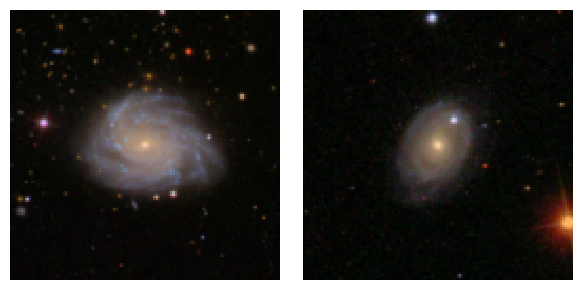

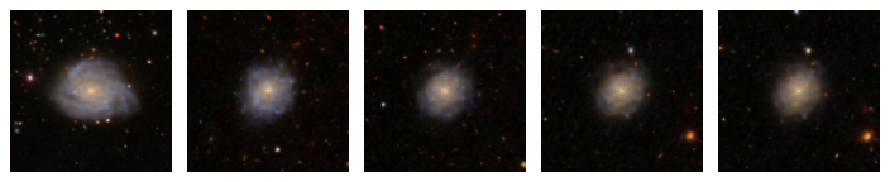

In [14]:
ima_1 = x_train[3]
ima_2 = x_train[15]

code_1 = np.asarray(encoder(np.expand_dims(ima_1, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_1[0])

code_2 = np.asarray(encoder(np.expand_dims(ima_2, axis=0)))[2,:,:]
print(">>> Encoding (mean): ",code_2[0])

#--- Decode n middle points
n=5
i=0
x_decoded_x = []

for i in range(n):
    x_decoded_x.append(np.squeeze(decoder.predict(code_1 + (code_2-code_1)/(i+1))))

#--- Show original images
show_image_row([ima_2, ima_1], plot_size=[6,3] )

show_image_row(x_decoded_x, plot_size=[9,3])

1/1 [==============================] - 0s 246ms/step


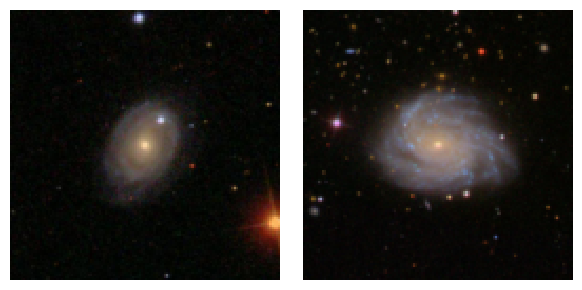

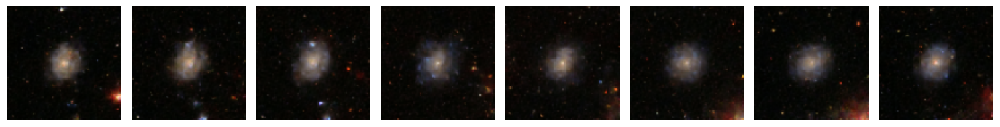

1/1 [==============================] - 0s 13ms/step


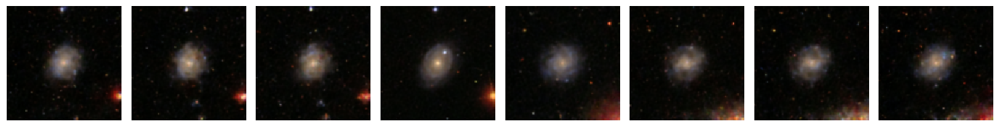

1/1 [==============================] - 0s 14ms/step


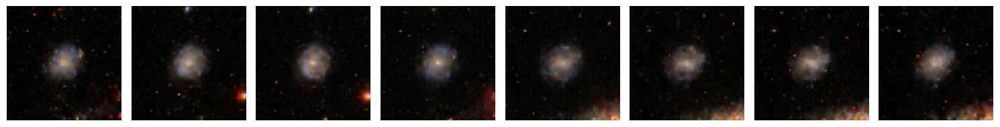

1/1 [==============================] - 0s 14ms/step


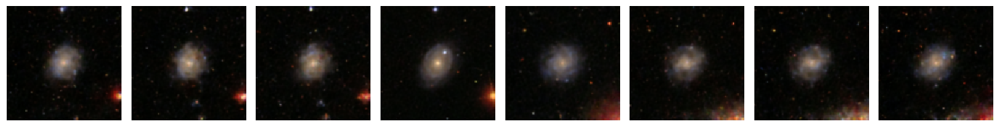

In [15]:
ima_1 = x_train[3]
ima_2 = x_train[15]

code_1 = np.asarray(encoder(np.expand_dims(ima_1, axis=0)))[2,:,:]
code_2 = np.asarray(encoder(np.expand_dims(ima_2, axis=0)))[2,:,:]

def getlatentpoints(starting_point):

    # Define the radius and number of points on the circumference
    radius = np.linalg.norm((code_2-code_1))/3
    num_points = 8

    # Calculate the angles between each point on the circumference and the point of interest
    angles = np.linspace(0, 2*np.pi, num_points+1)[:-1]
    delta_x = radius * np.cos(angles)
    delta_y = radius * np.sin(angles)

    # Create an array with the delta values for each dimension of the encoded space
    delta_encoded = np.zeros((num_points, 8))
    delta_encoded[:, :2] = np.array([delta_x, delta_y]).T

    # Calculate the coordinates of each point on the circumference
    circumference_points = starting_point + delta_encoded

    # Decode each point on the circumference
    decoded_images = decoder.predict(circumference_points)

    return decoded_images, circumference_points

latent_radius, samples = getlatentpoints(code_1)

show_image_row([ima_1, ima_2], plot_size=[6,3] )
show_image_row(latent_radius, plot_size=[15,8])

latent_radius, samples = getlatentpoints(samples[7])
show_image_row(latent_radius, plot_size=[15,8])

latent_radius, samples = getlatentpoints(samples[7])
show_image_row(latent_radius, plot_size=[15,8])

latent_radius, samples = getlatentpoints(samples[3])
show_image_row(latent_radius, plot_size=[15,8])